<a href="https://colab.research.google.com/github/Mike030668/MIPT_magistratura/blob/main/RL/DZ_2/Inference_DDQ_time_lstm_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Демонстрация игры обученного агента на среде [ViZDoom](https://github.com/mwydmuch/ViZDoom)

Сценарий - "защищай центр" (defend the center)

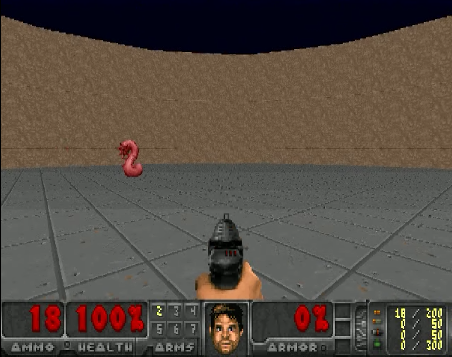

# Устанавливаем саму библиотеку ViZDoom из её гитхаб репозитории.

Для того, чтобы запустить среду ViZDoom в колаб-ноутбуке, нужно установить дополнительные программы, которые упомянаются в официальной [документации](https://vizdoom.farama.org/introduction/pythonQuickstart/).

Обычно уходит 3-5 минут на установку этой библиотеки.

In [1]:
%%bash
# %%bash - значит используем командную строку (не код питона)
apt-get update
# Устанавливаем нужные программы, которая требует от нас документация
apt-get install build-essential zlib1g-dev libsdl2-dev libjpeg-dev \
nasm tar libbz2-dev libgtk2.0-dev cmake git libfluidsynth-dev libgme-dev \
libopenal-dev timidity libwildmidi-dev unzip

# Устанавливаем библиотеку Boost
apt-get install libboost-all-dev

# Устанавливаем зависимости Lua
apt-get install liblua5.1-dev

# установку самой библиотеки.
pip install vizdoom

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,358 kB]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [1,920 kB]
Fetched 3,510 kB in 2s (2,181 kB/s)
Reading package lists...
Re

## Cкачиваем нужный сценарий для среды ViZDoom.
Сценарий - "защищай центр" ([defend the center](https://vizdoom.farama.org/environments/default/))

**Брать файлы defend_the_center.cfg и defend_the_center.wad - можно отсюда**

https://github.com/Farama-Foundation/ViZDoom/blob/master/scenarios/defend_the_center.wad

я себе скачал на диск

In [2]:
import gdown
# Подгружаем с публичной папки по https
file_path = 'https://drive.google.com/file/d/18yFz4O3O1L8o4HZNDF899-fVdDHzOtcZ/view?usp=drive_link'
# находим ID
file_id = file_path.split('/')[-2]
gdown.download('https://drive.google.com/uc?id=' + file_id, "scenario.zip", quiet=False)
# Разархивируем файлы
!unzip -qo /content/scenario.zip -d /content/

Downloading...
From: https://drive.google.com/uc?id=18yFz4O3O1L8o4HZNDF899-fVdDHzOtcZ
To: /content/scenario.zip
100%|██████████| 3.11k/3.11k [00:00<00:00, 2.67MB/s]


# скачиваем мои функции с репозитория

In [3]:
!git clone https://github.com/Mike030668/MIPT_magistratura.git -q
import sys
MAIN_DIR =  "/content/MIPT_magistratura/RL/DZ_2"
sys.path.append(MAIN_DIR)

from scripts.model import Make_DQN
from scripts.preprocessing import preprocess_frame
from scripts.rl_process import get_action

# imports

In [4]:
# Импортируем все функции из cреды ViZDoom
from vizdoom import *
import numpy as np
# Функция для удобного onehot энкодинга
from tensorflow.keras.utils import to_categorical
import cv2
# Функции для возпроизведение видео с результатом
from moviepy.editor import *
# Функция для управления вывода в колаб-ячейках
from google.colab import output

# Обученная модель

In [5]:
# Подгружаем с публичной папки по https
file_path = 'https://drive.google.com/file/d/1KeOElI7ROFvnIUFoXkWatscPoqPvHVrN/view?usp=sharing'
# находим ID
file_id = file_path.split('/')[-2]

model_name = 'vizdoom_DQN_model.h5'
gdown.download('https://drive.google.com/uc?id=' + file_id, model_name, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1KeOElI7ROFvnIUFoXkWatscPoqPvHVrN
To: /content/vizdoom_DQN_model.h5
100%|██████████| 1.98M/1.98M [00:00<00:00, 175MB/s]


'vizdoom_DQN_model.h5'

# Создание видео с игрой агента

 Для записи игр будет использоваться список куда мы будем записывать каждый кадр из игры. Этот массив кадр затем будет обработан и конвертирован в видео.

In [57]:
# Кадры из игр будут записываться в этот массив
video_frames = []

# Снова инициализируем среду.
game = DoomGame()
# Загружаем сценарий "защищай центр"
game.load_config("/content/scenario/defend_the_center.cfg")
# Устанавливаем размер кадров среды (будет 640 х 480)
game.set_screen_resolution(ScreenResolution.RES_640X480)
# Нужно отключить окно чтобы не было ошибки
game.set_window_visible(False)
# Снова инициализируем игру
game.init()

# Обычно в обучении с подкреплением ставят низкий шаг обучения, например 1e-4
#learning_rate = 1e-4
image_width = 64   # Ширина картинки (кадра)
image_height = 64  # Высота картинки (кадра)
chanels = 3        # каналов в картинке (кадра)

# будем брать новое состояние лишь раз в 4 кадра.
frames_per_action = 4
num_frames = 9     # Количество последовательных (через frames_per_action) кадров в одном состоянии
action_size = 3    # количество возможных действий

# Размерность каждого состояния - размер картинки
state_shape = (num_frames, image_width, image_height, chanels)

# Создаем основную модель (которая будет управлять агентом)
main_model = Make_DQN(state_shape, action_size, learning_rate = 1e-4)
main_model.load_weights('/content/vizdoom_DQN_model.h5')

# Генерим новый эпизод
game.new_episode()
# Извлекаем первый кадр (это ещё не полноценное состояние)
game_data = game.get_state()


# Извлекаем кадр из игры (480 x 640)
frame = game_data.screen_buffer
# Предобрабатываем кадр (размер 64 х 64) и добавляем ось вначале
processed_frame = preprocess_frame(frame,
                                   image_width,
                                   image_height,
                                   chanels)[None,:]

# В качестве первого состояния, просто дублируем кадр 4 раза.
current_state =  np.vstack([processed_frame for i in range(num_frames)])
# Записываем текущее состояние в предидущие состояние
previous_state = current_state

# для сбора и вывода поражений противника
# нет в явном виде на картинке
killed = 0
last_killed = 0

while True:
  # Извлекаем индекс награды и новое значение эпсилон
  action_index, epsilon, _ = get_action(main_model,
                                        previous_state,
                                        action_size,
                                        epsilon = 0,
                                        )
  # Приводим награду в onehot массив
  action_onehot = to_categorical(action_index)
  # Подаем действие в игровую среду в качестве списка
  game.set_action(action_onehot.tolist())
  # Игра продвигается на 4 кадра (значение frames_per_action)
  game.advance_action(frames_per_action)

  # Предобрабатываем кадр в чёрно-белый (размер 64 х 64 x 1)
  game_data = game.get_state()


  # Проверяем если эпизод закончился
  episode_done = game.is_episode_finished()

  # Выводим пораженных противников если идет игра
  # 1 - если поразили; 0 - если ничего; -1 - если убиты
  if not episode_done:
    game_info = game_data.game_variables

    killed += game.get_last_reward() # (+1; 0; -1)
    if last_killed != killed:
      last_killed = killed
      print(f"Поражено {killed} противников, остаток здоровья {game_info[1]}")

  # Нам необходимо возобновить среду и записать нужные статистики когда заканчивается эпизод
  if episode_done:

    # Затем необходимо начать новый эпизод игры
    game.new_episode()
    # Извлекаем новое состояние игры
    game_data = game.get_state()
    # Выходим из игрового цикла
    break

  # Извлекаем новый кадр из игры
  frame = game_data.screen_buffer
  # Предобрабатываем кадр (новая размерность будет 64 х 64 х 1)
  processed_frame = preprocess_frame(frame,
                                     image_width,
                                     image_height,
                                     chanels)
  # Обновляем состояние - удаляем последний кадр и добавляем новый
  current_state = np.append(current_state[1:num_frames, :, :, :], processed_frame[None,:],  axis = 0)
  # Запоминаем предыдущее состояние
  previous_state = current_state

  # Добавляем кадр в массив, меняем формат размерности (3, width, height) -> (width, height, 3)
  video_frames.append(np.rollaxis(frame, 0, 3))

print(f"\nВсего поражено {killed} противников")

1/1 [==============================] - 0s 23ms/step
Поражено 1.0 противников, остаток здоровья 100.0
1/1 [==============================] - 0s 21ms/step
Поражено 2.0 противников, остаток здоровья 100.0
1/1 [==============================] - 0s 26ms/step
Поражено 3.0 противников, остаток здоровья 100.0
1/1 [==============================] - 0s 24ms/step
Поражено 4.0 противников, остаток здоровья 100.0
1/1 [==============================] - 0s 23ms/step
Поражено 5.0 противников, остаток здоровья 100.0
1/1 [==============================] - 0s 22ms/step
Поражено 6.0 противников, остаток здоровья 100.0
1/1 [==============================] - 0s 22ms/step
Поражено 7.0 противников, остаток здоровья 100.0
1/1 [==============================] - 0s 23ms/step
Поражено 8.0 противников, остаток здоровья 88.0
1/1 [==============================] - 0s 22ms/step
Поражено 9.0 противников, остаток здоровья 72.0
1/1 [==============================] - 0s 23ms/step
Поражено 10.0 противников, остаток здоров

## main_model.summary

In [ ]:
print(main_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 9, 32, 32, 64)     1792      
 ributed)                                                        
                                                                 
 time_distributed_1 (TimeDi  (None, 9, 32, 32, 64)     16448     
 stributed)                                                      
                                                                 
 time_distributed_2 (TimeDi  (None, 9, 16, 16, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_3 (TimeDi  (None, 9, 8, 8, 128)      73856     
 stributed)                                                      
                                                                 
 time_distributed_4 (TimeDi  (None, 9, 8, 8, 128)      6

# Запись результата в видео

У нас есть массив кадр, нам нужно конвертировать его в видео. Для этого мы используем библиотеку cv2. Создаем объект для воспроизведениед видео (задаем путь к файлу видео, формат видео, кадры в секунду, и размер изображений)

In [58]:
# Чем больше кадров в секунду, тем быстее видео будет проигрываться
out = cv2.VideoWriter('/content/episode.avi', cv2.VideoWriter_fourcc(*'DIVX'), 20, (640, 480))

# В цикле добавляем каждый кадр в видео (делаем предобработку кадра - меняем каналы с RGB в BGR
# это нужно потому что cv2 воспринимает каналы как BGR)
for i in range(len(video_frames)):
  out.write(cv2.cvtColor(video_frames[i], cv2.COLOR_RGB2BGR))

# Закрываем объект для создания видео
out.release()

## Отображение видео в колабе

Для этого мы снова обратимся к библиотеки moviepy. Конкретно мы будем использовать функцию VideoFileClip для воспроизведения видео.

In [59]:
# Указываем путь к видео
path="/content/episode.avi"

# Извлекаем видео из заданного пути (куда мы ранее записыли видео через cv2)
clip=VideoFileClip(path)

# Отображаем видео в колабе
clip.ipython_display(width=640, maxduration = 40)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
